<a href="https://colab.research.google.com/github/rocketwolf98/ColabCompilation/blob/main/SpotifyKNNRegression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install ydata-profiling
!pip install fireducks

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 23.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=a341828a0f7a0c3f1e36d07c78ef2ba981dee7dbc51354674b6f7168d1b78c87
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 MB 20.0 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
     

In [2]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import kagglehub

In [3]:
path = kagglehub.dataset_download("joebeachcapital/30000-spotify-songs")

100%|██████████| 3.01M/3.01M [00:00<00:00, 3.41MB/s]

Extracting files...


In [4]:
path = '/root/.cache/kagglehub/datasets/joebeachcapital/30000-spotify-songs/versions/2/spotify_songs.csv'
df = pd.read_csv(path)
df.head(5)

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [6]:
df.dropna(inplace=True)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32828 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32828 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32828 non-null  int64  
 4   track_album_id            32828 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32828 non-null  object 
 7   playlist_name             32828 non-null  object 
 8   playlist_id               32828 non-null  object 
 9   playlist_genre            32828 non-null  object 
 10  playlist_subgenre         32828 non-null  object 
 11  danceability              32828 non-null  float64
 12  energy                    32828 non-null  float64
 13  key                       32828 non-null  int64  
 14  loudness   

In [ ]:
profile = ProfileReport(df, title="Profile Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df = df.select_dtypes(include=np.number)
df.head()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,66,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,67,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,70,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,60,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,69,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


## Creating the function

In [29]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.feature_selection import chi2, SelectKBest
from sklearn.metrics import r2_score

In [10]:
def get_best_neigbors(X, y, k_range=(1, 15), instances=50):
    '''
    Gets the X feature, y target, range of acceptable k values, and number of training instances.
    By default, this will have a test size of 25% and random state of 0.
    '''
    k_values = list(range(k_range[0], k_range[1] + 1))
    training_acc = []
    test_acc = []

    for n in k_values:
        training_acc_n = []
        test_acc_n = []

        for i in range(instances):
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
            reg = KNeighborsRegressor(n_neighbors=n)
            reg.fit(X_train, y_train)
            training_acc_n.append(reg.score(X_train, y_train))
            test_acc_n.append(reg.score(X_test, y_test))

        training_acc.append(np.mean(training_acc_n))
        test_acc.append(np.mean(test_acc_n))

    training_acc = np.array(training_acc)
    test_acc = np.array(test_acc)

    acc_diff = np.abs(training_acc - test_acc)
    min_acc = np.min(acc_diff)

    best_k_indices = np.where(acc_diff == min_acc)[0].tolist()
    optimal_n_neighbors = [k_values[i] for i in best_k_indices]

    plt.figure(figsize=(10, 6))
    plt.plot(k_values, training_acc, label="Mean Training Accuracy", marker="o")
    plt.plot(k_values, test_acc, label="Mean Testing Accuracy", marker="o")

    for n in optimal_n_neighbors:
      plt.axvline(n, color='r', linestyle='--', label=f'Optimal k: {n}')

    plt.ylabel("Accuracy")
    plt.xlabel("n_neighbors")
    plt.title(f"Mean Accuracy over {instances} Instances\nOptimal k: {optimal_n_neighbors} with Training Score: {training_acc[best_k_indices[0]]:.2f} and Test Score: {test_acc[best_k_indices[0]]:.2f}")
    plt.legend()
    plt.show()
    return optimal_n_neighbors

In [30]:
def get_best_features(data, column, k):
  x= data
  y= x[column]

  selector = SelectKBest(score_func= chi2, k=k)
  X_new = selector.fit_transform(x, y)

  feature_scores = selector.scores_
  selected_features = x.columns[selector.get_support()]

  return pd.DataFrame({'Feature':selected_features, 'Feature_Score':feature_scores})

In [17]:
target = df["track_popularity"]
feature = df.drop(columns='track_popularity')

In [21]:
target.shape

(32828,)

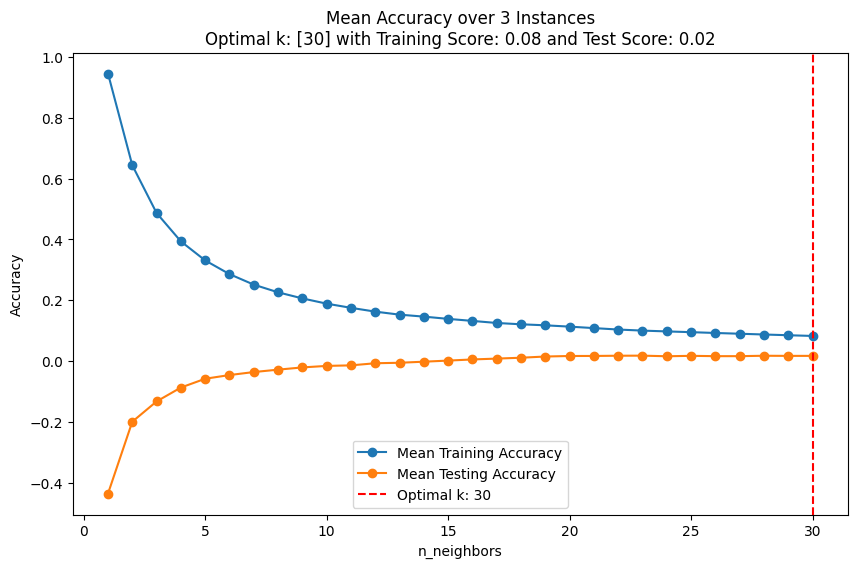

[30]

In [32]:
get_best_neigbors(feature, target, k_range=(1,30), instances=3)

In [31]:
get_best_features(df, 'track_popularity', 2)

ValueError: Input X must be non-negative.